In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
import numpy as np


In [3]:
data = pd.read_csv("globalterrorismdb_cleaned.csv")

# Attacks Trend Over Year

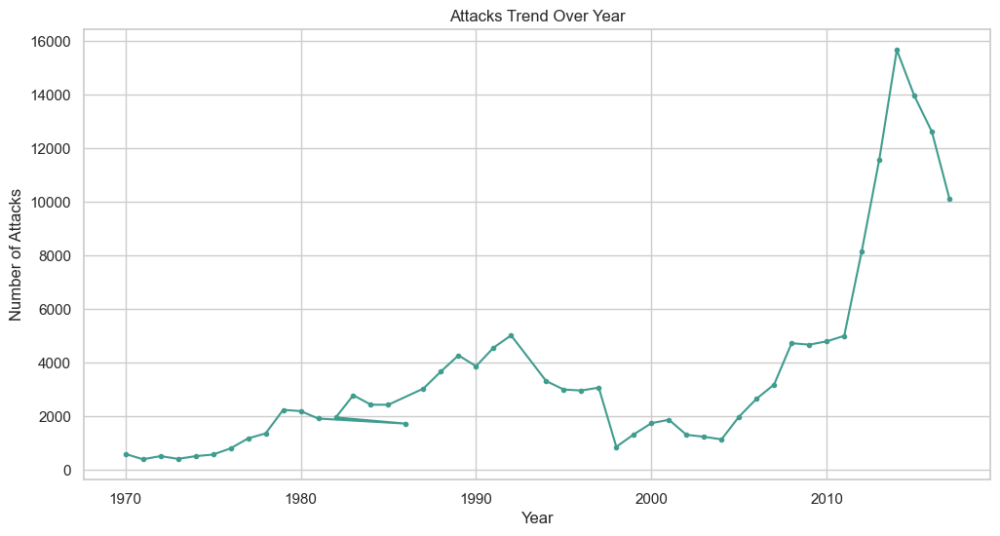

In [118]:
x=data['Year'].unique()
y=data.groupby('Year')['eventid'].count()
plt.figure(figsize=(12,6))
plt.plot(
            x,y,
            color='#409C8E',
            marker=".",
            
           )
plt.xlabel('Year')
plt.ylabel('Number of Attacks')
plt.title('Attacks Trend Over Year')

plt.show()

# Number of attacks by region

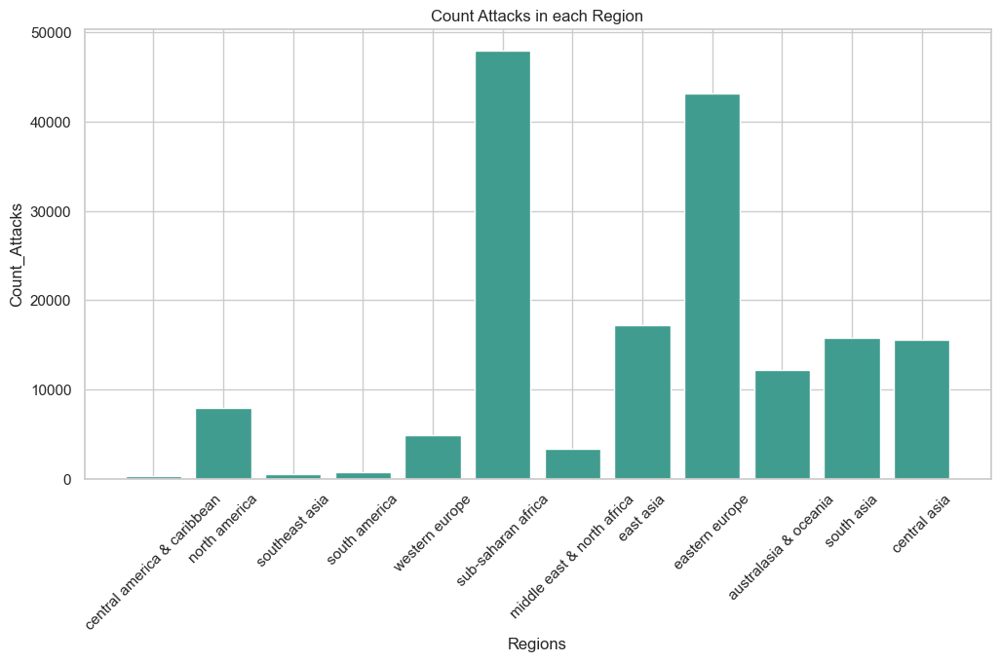

In [121]:
regions=data['Region'].unique()
count_attacks=data.groupby('Region')['eventid'].count()
plt.figure(figsize=(12,6))
plt.bar(regions,count_attacks,color='#409C8E')
plt.xlabel('Regions')
plt.ylabel('Count_Attacks')
plt.xticks(rotation=45)
plt.title('Count Attacks in each Region')
plt.show()

# most affected countries

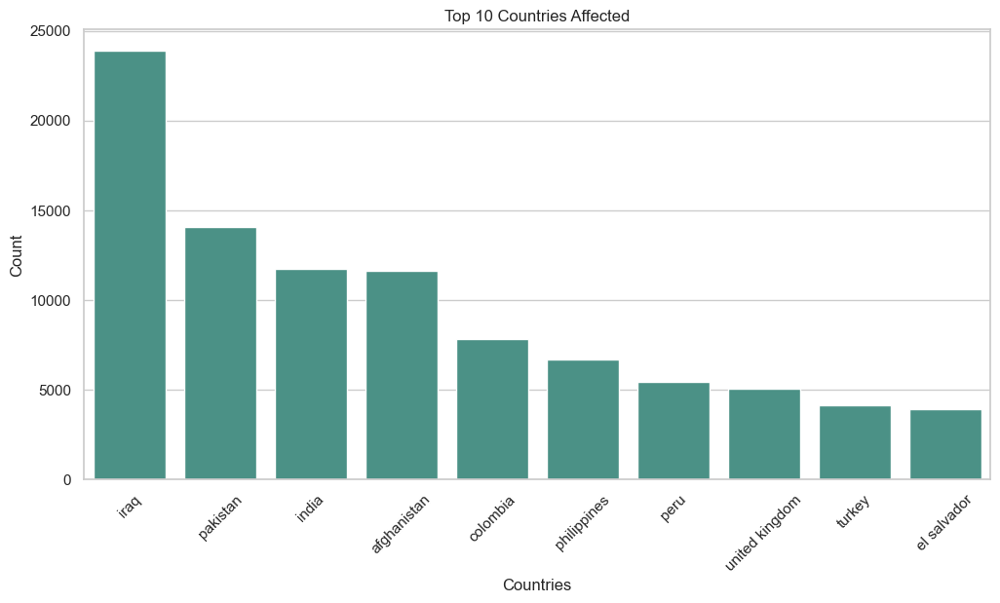

In [125]:
plt.subplots(figsize=(12,6))
top=data['Country'].value_counts()[:10].to_frame().reset_index()
top.columns= ['Country','Attacks_Count']
sb.barplot(x='Country',y='Attacks_Count', data= top, color='#409C8E')
plt.title('Top 10 Countries Affected')
plt.xlabel('Countries')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

# Attacks type

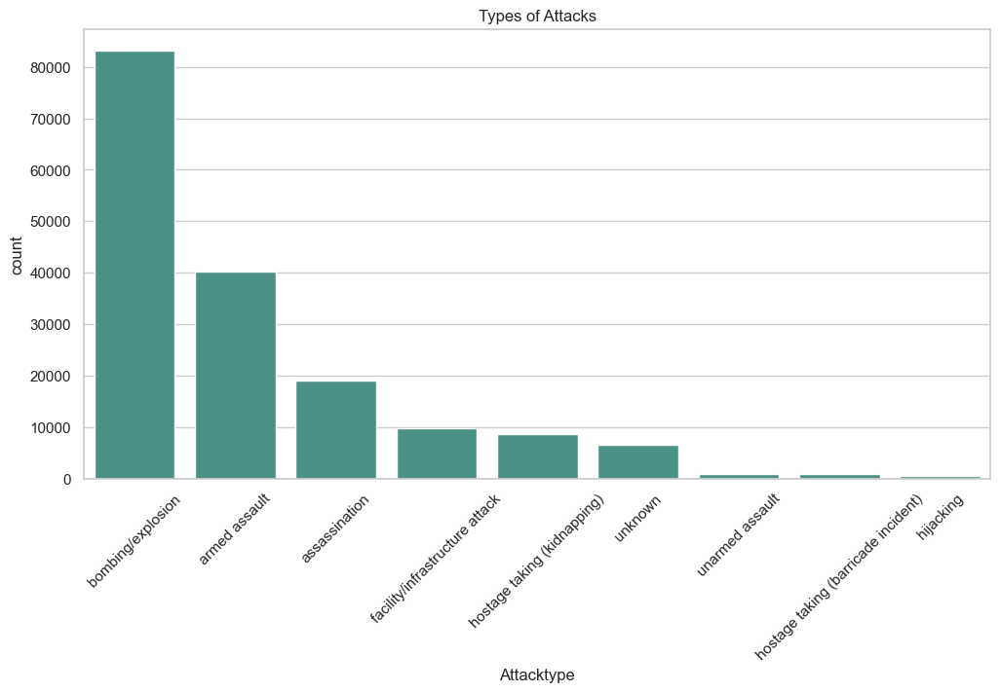

In [129]:
plt.figure(figsize=(12,6))
sb.countplot(data=data,x='Attacktype',order=data['Attacktype'].value_counts().index,color='#409C8E')
plt.xticks(rotation=45)
plt.title('Types of Attacks')
plt.show()

# targets

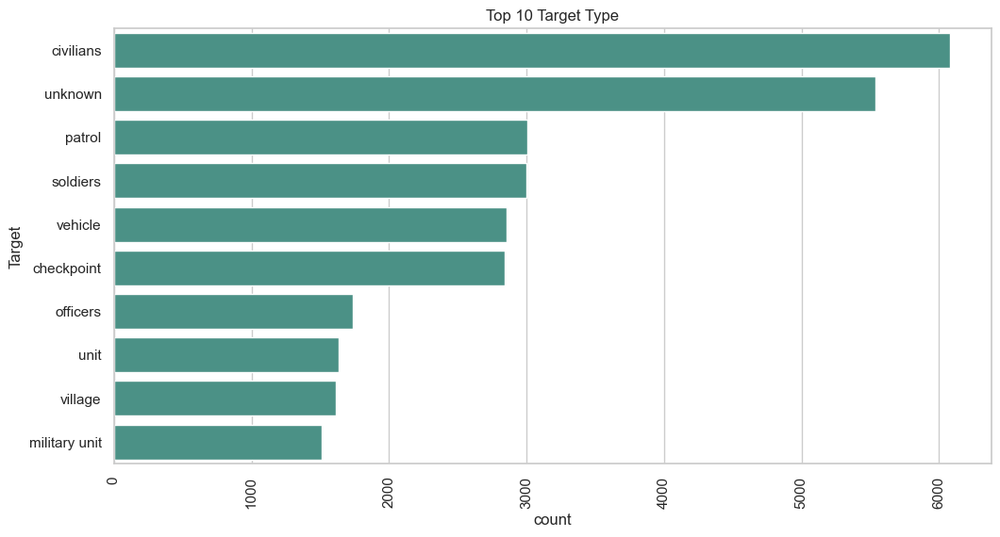

In [130]:
plt.figure(figsize=(12,6))
sb.countplot(data=data,y='Target',order=data['Target'].value_counts()[:10].index,color='#409C8E')
plt.title('Top 10 Target Type')
plt.xticks(rotation=90)
plt.show()

In [10]:
import plotly.express as px
top_groups = data['Gname'].value_counts()[1:14].index
filtered_data = data[data['Gname'].isin(top_groups)]


fig = px.scatter_mapbox(filtered_data, lat='latitude', lon='longitude',
                        hover_name='Gname', color='Gname',
                        title='Regional Activities of Terrorist Groups',
                        zoom=1, height=800)

fig.update_layout(mapbox_style="carto-positron")
fig.update_geos(projection_type="orthographic")
fig.update_traces(marker=dict(size=10, opacity=0.5))


fig.show(renderer="notebook")

# top 10 attack groups

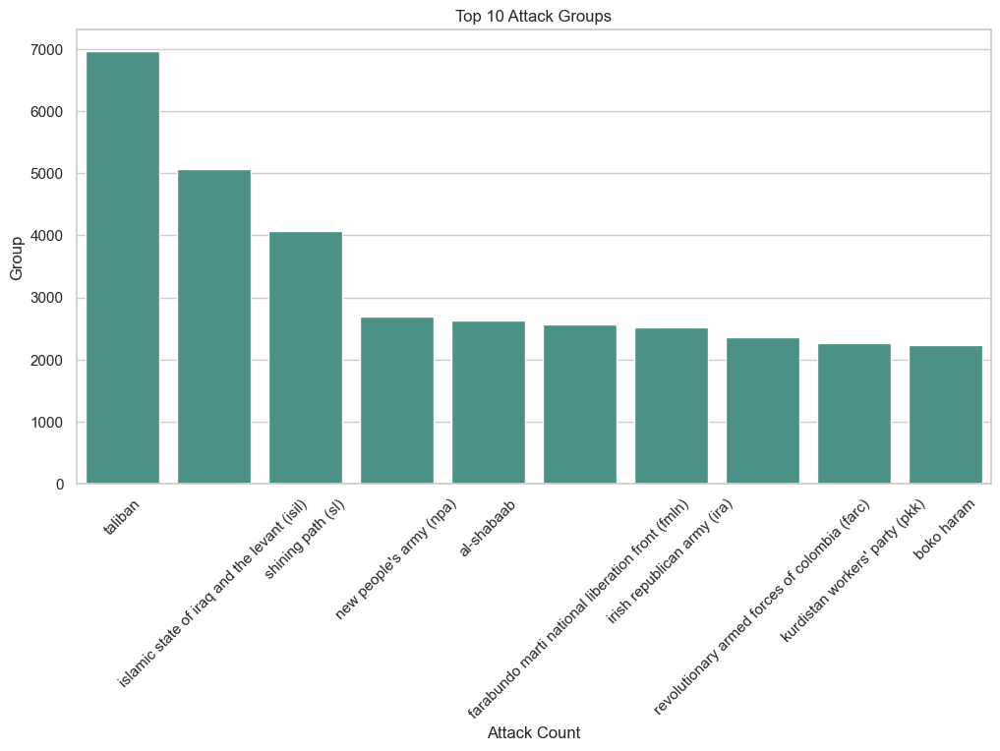

In [134]:
group_counts = data['Gname'].value_counts()
sort = group_counts.sort_values(ascending=False)

sort = sort.iloc[1:]
top_10 = sort.head(10)
sb.set(style="whitegrid")
plt.figure(figsize=(12, 6))
sb.barplot(x=top_10.index, y=top_10.values, color='#409C8E')
plt.title('Top 10 Attack Groups')
plt.xlabel('Attack Count')
plt.ylabel('Group')
plt.xticks(rotation = 45)
plt.show()

# number of wounded and killed by year 

In [11]:
values = data[['Year','Nkill','nwound']].groupby('Year').sum().reset_index()

values = pd.melt(values, id_vars='Year', value_vars=['nwound','Nkill'],var_name='injury type', value_name='amount')

fig = px.line(values, x="Year", y="amount", color='injury type', color_discrete_sequence=['#409C8E','red'])
fig.update_layout(title=dict(text='Number of Wounded and Killed over time', font=dict(size=25)),
                xaxis_title="Year",
                yaxis_title="Number of injuries",)
    
fig.show()

# wounded and killed by region

<Figure size 1200x600 with 0 Axes>

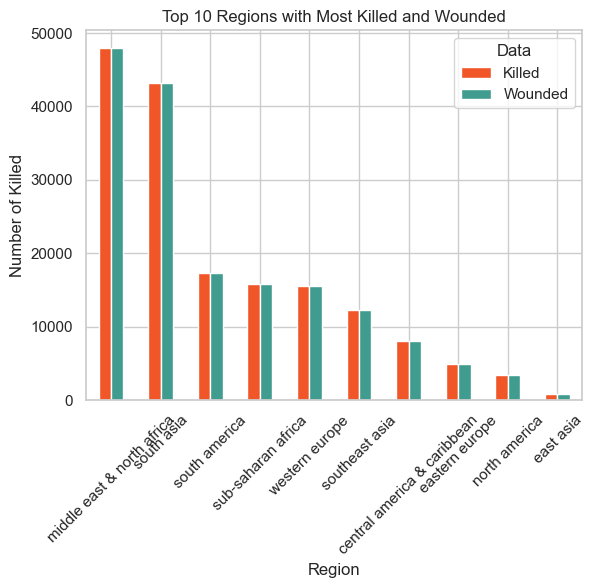

In [152]:
result=data.groupby('Region')[['Nkill','nwound']].count().sort_values(by=['Nkill','nwound'],ascending=False).head(10)
plt.figure(figsize=(12,6))
result.plot(kind='bar', color=['#F15628','#409C8E'])
plt.xlabel('Region')
plt.ylabel('Number of Killed')
plt.title('Top 10 Regions with Most Killed and Wounded')
plt.xticks(rotation=45)
plt.legend(title='Data', labels=['Killed', 'Wounded'])
plt.show()

# heatmap

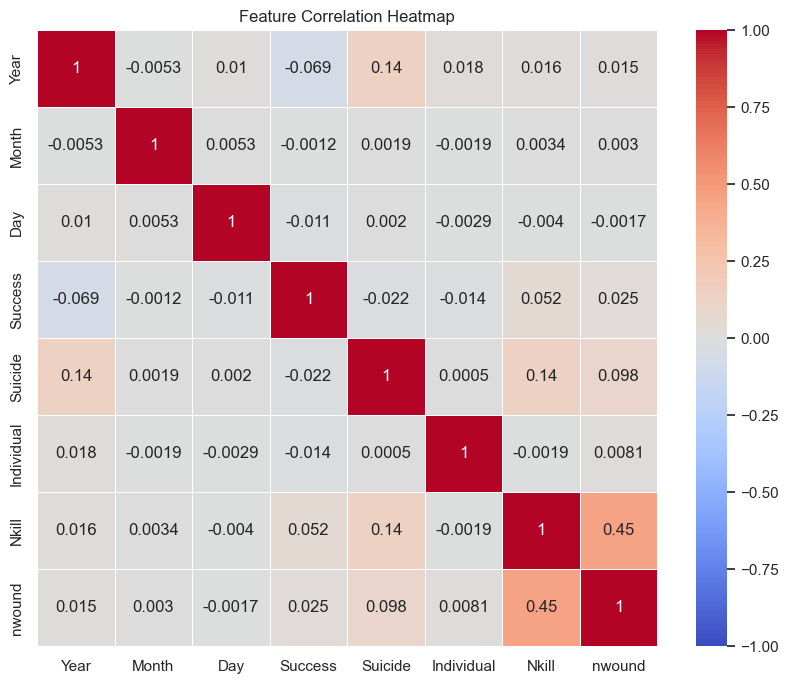

In [164]:
columns=['Year','Month','Day','Success','Suicide','Individual','Nkill','nwound']
new_data=data[columns]
corr = new_data.corr()

plt.figure(figsize=(10, 8))
sb.heatmap(corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Feature Correlation Heatmap')
plt.show()

# scatter plot

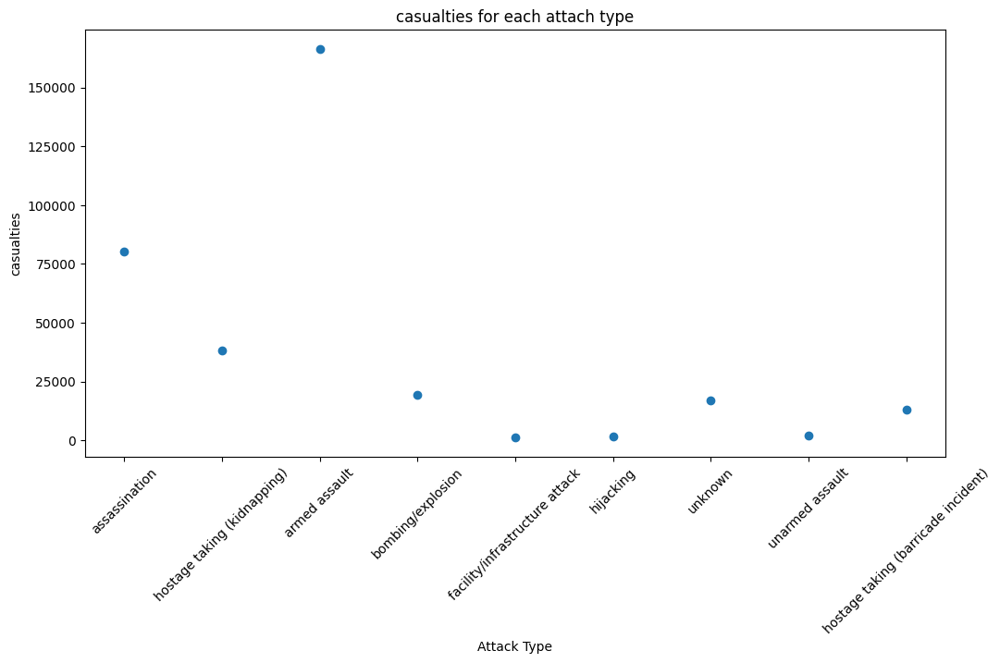

In [25]:
d=data.groupby('Attacktype')[['Nkill','nwound']].count()

x=data['Attacktype'].unique()
y=d['Nkill']+d['nwound']

plt.figure(figsize=(12,6))
plt.scatter(x,y)
plt.xlabel('Attack Type')
plt.ylabel('casualties')
plt.title('casualties for each attach type')
plt.xticks(rotation=45)
plt.show()

# total killed in each region

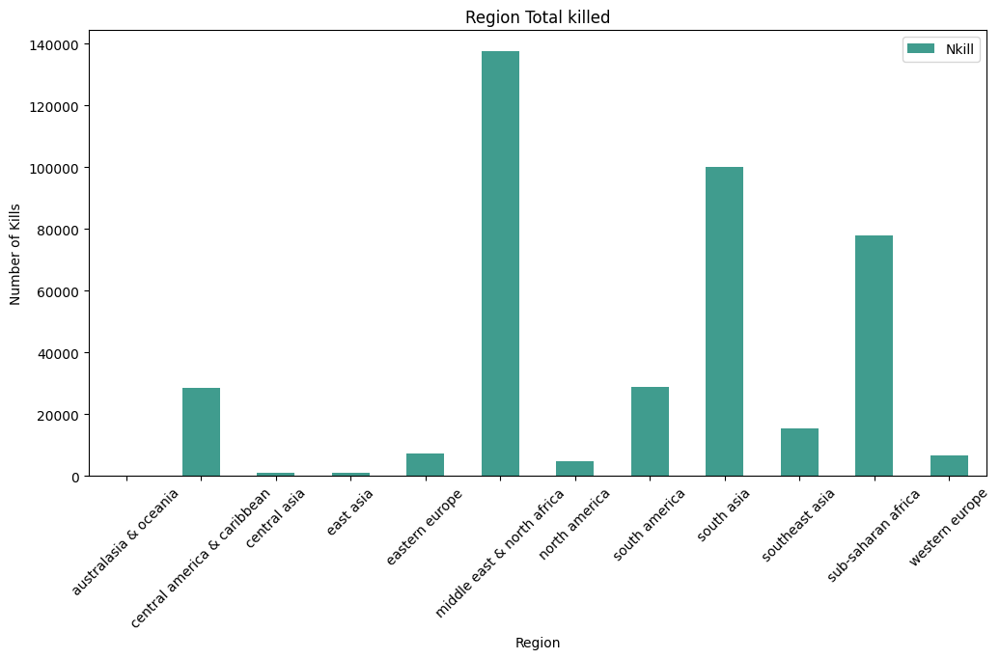

In [50]:
Reg_wise_kill = data[["Region", "Nkill"]].groupby("Region").sum()
Reg_wise_kill.plot(kind = "bar", color = "#409C8E", figsize = (12,6))
plt.title("Region Total killed")
plt.xlabel("Region")
plt.ylabel("Number of Kills")
plt.xticks(rotation=45)
plt.show()

# Weaptype	

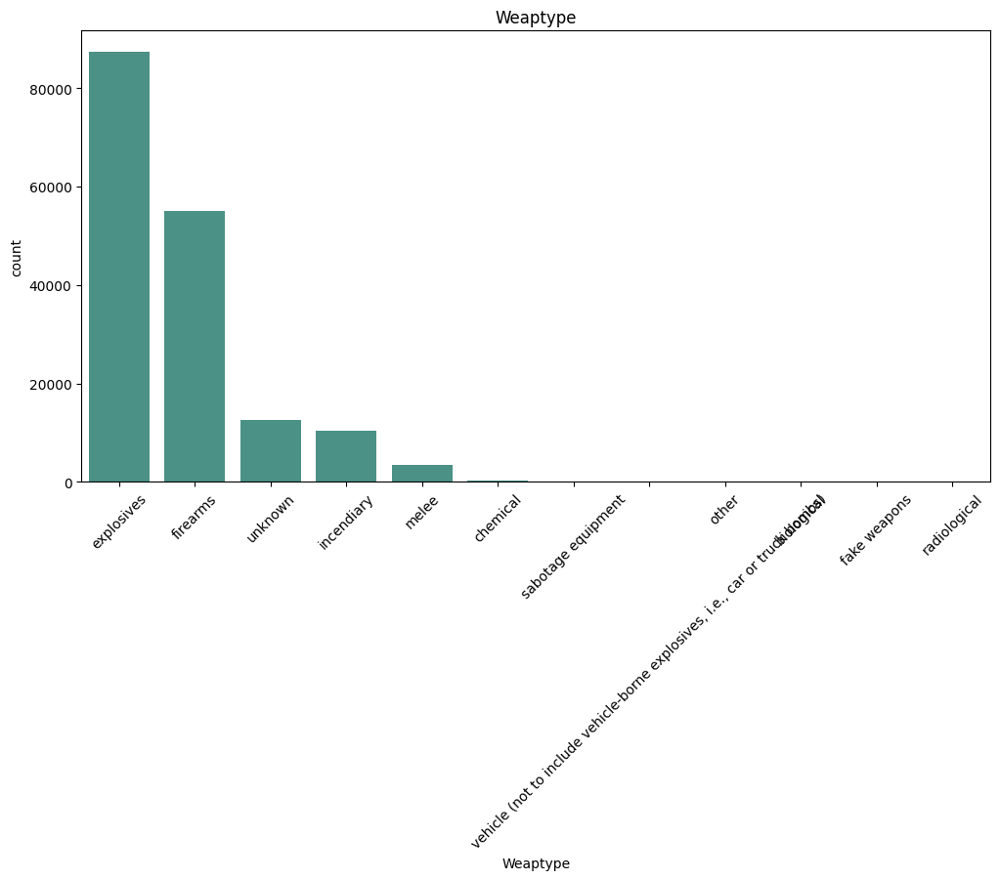

In [8]:
plt.figure(figsize=(12,6))
sb.countplot(data=data,x='Weaptype',order=data['Weaptype'].value_counts().index,color='#409C8E')
plt.xticks(rotation=45)
plt.title('Weaptype')
plt.show()